<a href="https://colab.research.google.com/github/Zardian18/Denoising-Diffusion-Model-Flowers/blob/master/DDM_flowers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://raw.githubusercontent.com/Zardian18/helper-functions-colab/master/helper.py

--2024-01-27 07:44:36--  https://raw.githubusercontent.com/Zardian18/helper-functions-colab/master/helper.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17171 (17K) [text/plain]
Saving to: ‘helper.py’

helper.py           100%[===================>]  16.77K  --.-KB/s    in 0.001s  

2024-01-27 07:44:36 (22.2 MB/s) - ‘helper.py’ saved [17171/17171]



In [2]:
!pip install kaggle

In [3]:
from google.colab import drive
drive.mount("/content/drive")

! mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

Mounted at /content/drive


In [4]:
! kaggle datasets download -d nunenuh/pytorch-challange-flower-dataset

 98% 325M/330M [00:04<00:00, 80.9MB/s]
100% 330M/330M [00:04<00:00, 71.4MB/s]


In [5]:
! unzip pytorch-challange-flower-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/48/image_04685.jpg  
  inflating: dataset/train/48/image_04686.jpg  
  inflating: dataset/train/48/image_04689.jpg  
  inflating: dataset/train/48/image_04692.jpg  
  inflating: dataset/train/48/image_04694.jpg  
  inflating: dataset/train/48/image_04695.jpg  
  inflating: dataset/train/49/image_06198.jpg  
  inflating: dataset/train/49/image_06199.jpg  
  inflating: dataset/train/49/image_06200.jpg  
  inflating: dataset/train/49/image_06201.jpg  
  inflating: dataset/train/49/image_06203.jpg  
  inflating: dataset/train/49/image_06204.jpg  
  inflating: dataset/train/49/image_06205.jpg  
  inflating: dataset/train/49/image_06206.jpg  
  inflating: dataset/train/49/image_06207.jpg  
  inflating: dataset/train/49/image_06208.jpg  
  inflating: dataset/train/49/image_06211.jpg  
  inflating: dataset/train/49/image_06212.jpg  
  inflating: dataset/train/49/image_06214.jpg  
  inflating: dataset/train/49/image_0

In [6]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-colorblind")

import math

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    optimizers,
    utils,
    callbacks,
    metrics,
    losses,
    activations,
)

from helper import display, sample_batch

In [7]:
train_data = utils.image_dataset_from_directory(
    "/content/dataset",
    labels= None,
    image_size=(64,64),
    batch_size = None,
    shuffle = True,
    seed = 42,
    interpolation= "bilinear"
)

Found 8189 files belonging to 1 classes.


In [8]:
train_data

<_PrefetchDataset element_spec=TensorSpec(shape=(64, 64, 3), dtype=tf.float32, name=None)>

In [9]:
def preprocess(imgs):
  imgs = tf.cast(imgs, "float32")/255.0
  return imgs

In [10]:
train = train_data.map(lambda x: preprocess(x))
train = train.repeat(5)
train = train.batch(64, drop_remainder = True)

In [11]:
train

<_BatchDataset element_spec=TensorSpec(shape=(64, 64, 64, 3), dtype=tf.float32, name=None)>

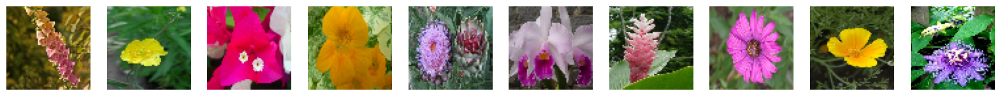

In [12]:
display(sample_batch(train))

## Linear Diffuser

In [13]:
def linear_diffusion_schedule(diffusion_times):
  min_rate = 0.0001
  max_rate = 0.02
  betas = min_rate + tf.convert_to_tensor(diffusion_times)*(max_rate - min_rate)
  alphas = 1- betas
  alpha_bars = tf.math.cumprod(alphas)
  signal_rates = alpha_bars
  noise_rates = 1- alpha_bars
  return noise_rates, signal_rates

## Cosine Diffuser

In [14]:
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

## Offset cosine Scheduler

In [15]:
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

In [16]:
T = 1000
diffusion_times = tf.convert_to_tensor([x / T for x in range(T)])

linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(diffusion_times)

cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(diffusion_times)

(offset_cosine_noise_rates,offset_cosine_signal_rates,) = offset_cosine_diffusion_schedule(diffusion_times)

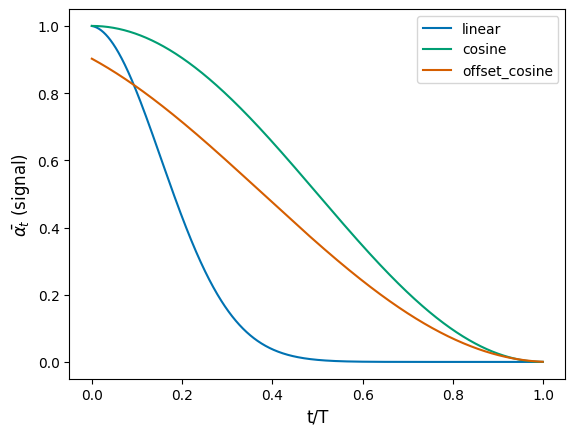

In [17]:
plt.plot(
    diffusion_times, linear_signal_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_signal_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_signal_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$\bar{\alpha_t}$ (signal)", fontsize=12)
plt.legend()
plt.show()

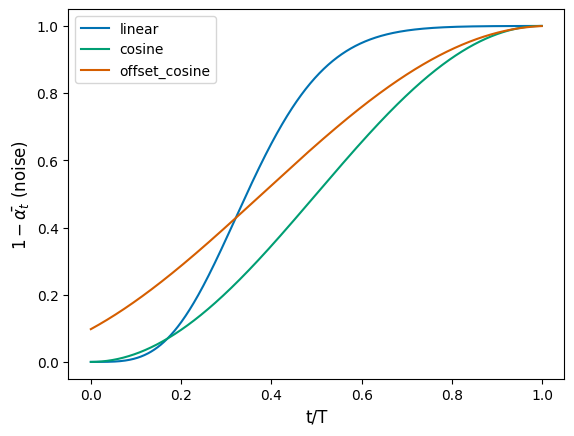

In [18]:
plt.plot(
    diffusion_times, linear_noise_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_noise_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_noise_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$1-\bar{\alpha_t}$ (noise)", fontsize=12)
plt.legend()
plt.show()

In [19]:
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            16,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

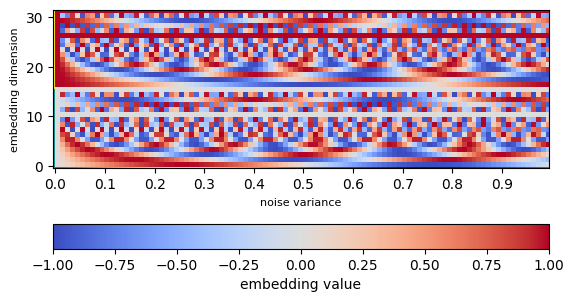

In [20]:
embedding_list = []
for y in np.arange(0, 1, 0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(
    np.arange(0, 100, 10), labels=np.round(np.arange(0.0, 1.0, 0.1), 1)
)
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel("noise variance", fontsize=8)
plt.pcolor(embedding_array, cmap="coolwarm")
plt.colorbar(orientation="horizontal", label="embedding value")
ax.imshow(embedding_array, interpolation="nearest", origin="lower")
plt.show()

## Unet

In [21]:
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", activation=activations.swish
        )(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply

In [22]:
noisy_images = layers.Input(shape=(64, 64, 3))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)

noise_variances = layers.Input(shape=(1, 1, 1))
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances)
noise_embedding = layers.UpSampling2D(size=64, interpolation="nearest")(
    noise_embedding
)

x = layers.Concatenate()([x, noise_embedding])

skips = []

x = DownBlock(32, block_depth=2)([x, skips])
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])

x = ResidualBlock(128)(x)
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth=2)([x, skips])
x = UpBlock(64, block_depth=2)([x, skips])
x = UpBlock(32, block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

unet = models.Model([noisy_images, noise_variances], x, name="unet")

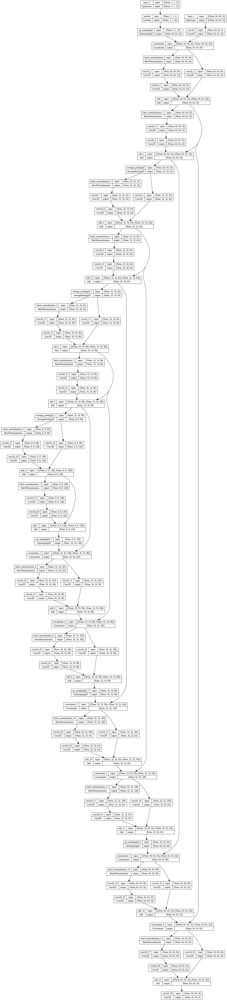

In [23]:
from keras.utils import plot_model
plot_model(unet, show_shapes=True)

In [24]:
unet.summary()

Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 1, 1, 1)]            0         []                            
                                                                                                  
 input_1 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 lambda (Lambda)             (None, 1, 1, 32)             0         ['input_2[0][0]']             
                                                                                                  
 conv2d (Conv2D)             (None, 64, 64, 32)           128       ['input_1[0][0]']             
                                                                                               

## Diffusion Model

In [25]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denormalize(self, images):
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps):
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, 64, 64, 3)
            )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True)
        noises = tf.random.normal(shape=tf.shape(images))
        batch_size = tf.shape(images)[0]
        diffusion_times = tf.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(0.999 * ema_weight + (1 - 0.999) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=tf.shape(images))
        batch_size = tf.shape(images)[0]
        diffusion_times = tf.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [26]:
ddm = DiffusionModel()
ddm.normalizer.adapt(train)

In [27]:
ddm.compile(
    optimizer=optimizers.experimental.AdamW(
        learning_rate=0.001, weight_decay=0.0001
    ),
    loss=losses.mean_absolute_error,
)

In [28]:
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
            num_images=self.num_img,
            diffusion_steps=20,
        ).numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )


image_generator_callback = ImageGenerator(num_img=10)

In [29]:
!mkdir output/

Epoch 1/25
  6/639 [..............................] - ETA: 2:00 - n_loss: 0.2078

639/639 [==============================] - ETA: 0s - n_loss: 0.2002
Saved to ./output/generated_img_000.png


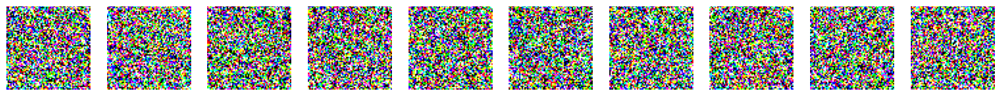

639/639 [==============================] - 130s 199ms/step - n_loss: 0.2002
Epoch 2/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1913
Saved to ./output/generated_img_001.png


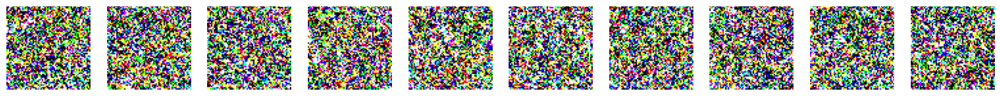

639/639 [==============================] - 131s 202ms/step - n_loss: 0.1913
Epoch 3/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1870
Saved to ./output/generated_img_002.png


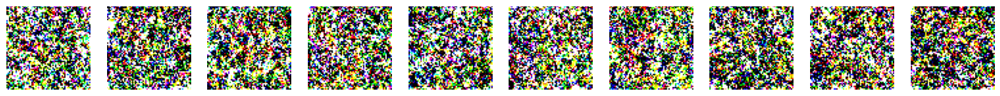

639/639 [==============================] - 132s 205ms/step - n_loss: 0.1870
Epoch 4/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1846
Saved to ./output/generated_img_003.png


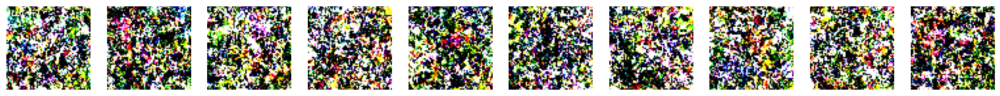

639/639 [==============================] - 133s 205ms/step - n_loss: 0.1846
Epoch 5/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1827
Saved to ./output/generated_img_004.png


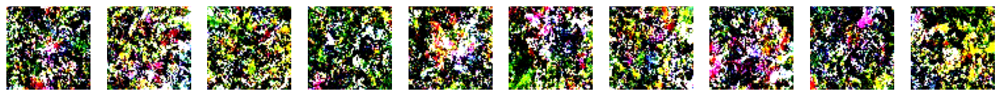

639/639 [==============================] - 131s 202ms/step - n_loss: 0.1827
Epoch 6/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1810
Saved to ./output/generated_img_005.png


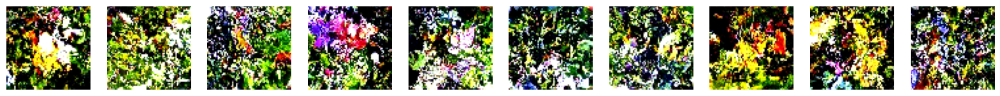

639/639 [==============================] - 132s 204ms/step - n_loss: 0.1810
Epoch 7/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1807
Saved to ./output/generated_img_006.png


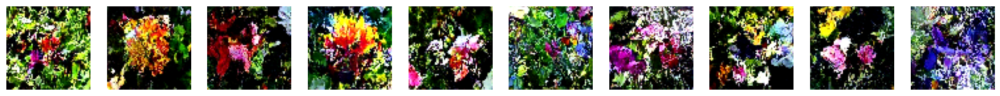

639/639 [==============================] - 131s 203ms/step - n_loss: 0.1807
Epoch 8/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1790
Saved to ./output/generated_img_007.png


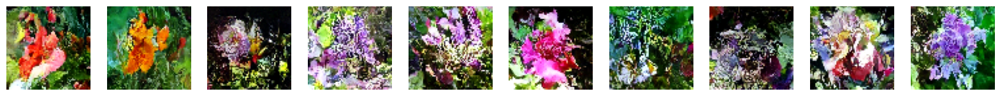

639/639 [==============================] - 132s 204ms/step - n_loss: 0.1790
Epoch 9/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1780
Saved to ./output/generated_img_008.png


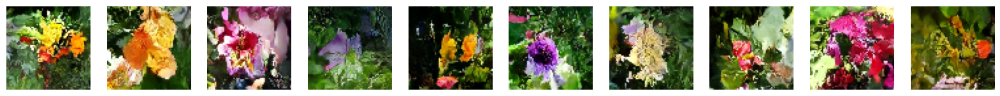

639/639 [==============================] - 133s 206ms/step - n_loss: 0.1780
Epoch 10/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1781
Saved to ./output/generated_img_009.png


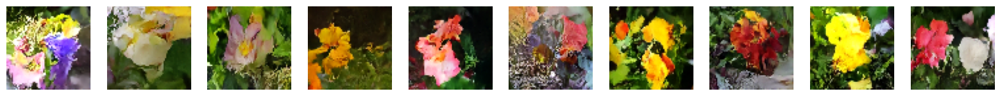

639/639 [==============================] - 131s 203ms/step - n_loss: 0.1781
Epoch 11/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1770
Saved to ./output/generated_img_010.png


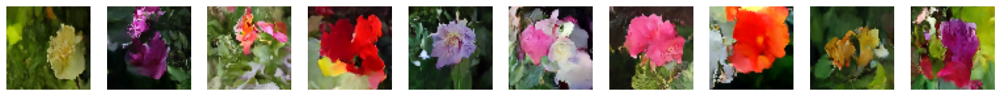

639/639 [==============================] - 131s 204ms/step - n_loss: 0.1770
Epoch 12/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1770
Saved to ./output/generated_img_011.png


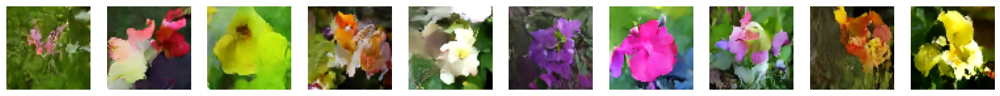

639/639 [==============================] - 133s 206ms/step - n_loss: 0.1770
Epoch 13/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1765
Saved to ./output/generated_img_012.png


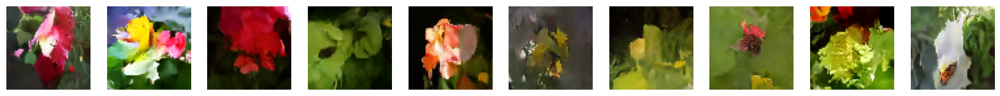

639/639 [==============================] - 131s 203ms/step - n_loss: 0.1765
Epoch 14/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1765
Saved to ./output/generated_img_013.png


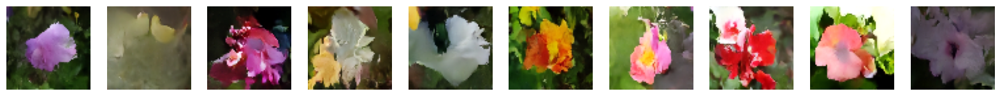

639/639 [==============================] - 132s 205ms/step - n_loss: 0.1765
Epoch 15/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1760
Saved to ./output/generated_img_014.png


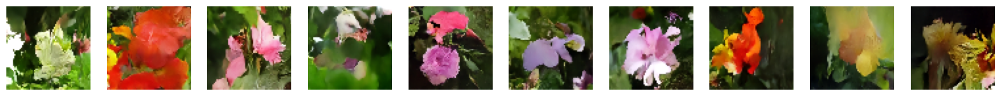

639/639 [==============================] - 134s 207ms/step - n_loss: 0.1760
Epoch 16/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1752
Saved to ./output/generated_img_015.png


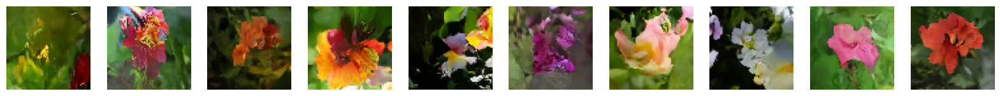

639/639 [==============================] - 132s 205ms/step - n_loss: 0.1752
Epoch 17/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1756
Saved to ./output/generated_img_016.png


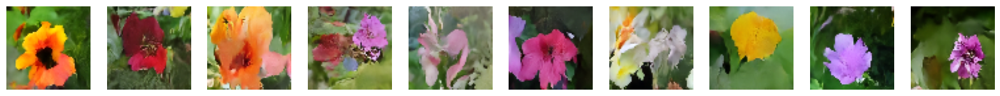

639/639 [==============================] - 133s 207ms/step - n_loss: 0.1756
Epoch 18/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1749
Saved to ./output/generated_img_017.png


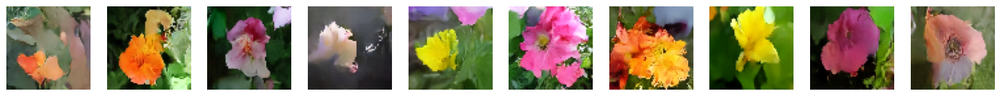

639/639 [==============================] - 133s 205ms/step - n_loss: 0.1749
Epoch 19/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1757
Saved to ./output/generated_img_018.png


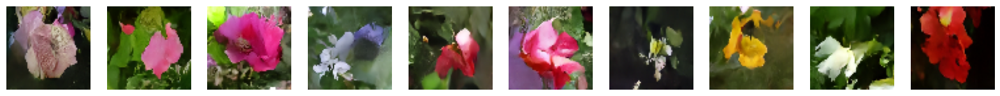

639/639 [==============================] - 133s 206ms/step - n_loss: 0.1757
Epoch 20/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1747
Saved to ./output/generated_img_019.png


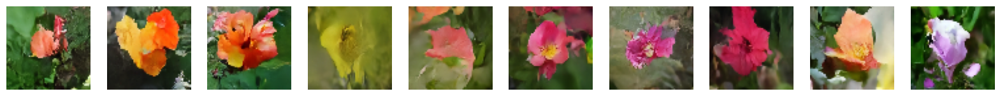

639/639 [==============================] - 134s 208ms/step - n_loss: 0.1747
Epoch 21/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1745
Saved to ./output/generated_img_020.png


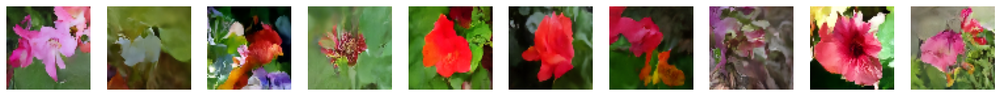

639/639 [==============================] - 135s 209ms/step - n_loss: 0.1745
Epoch 22/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1739
Saved to ./output/generated_img_021.png


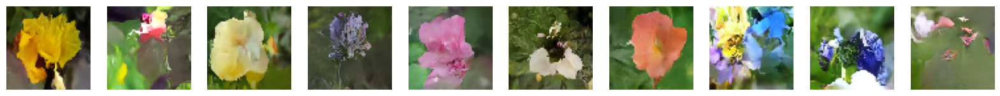

639/639 [==============================] - 143s 222ms/step - n_loss: 0.1739
Epoch 23/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1742
Saved to ./output/generated_img_022.png


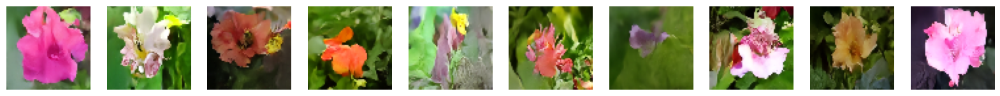

639/639 [==============================] - 134s 208ms/step - n_loss: 0.1742
Epoch 24/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1737
Saved to ./output/generated_img_023.png


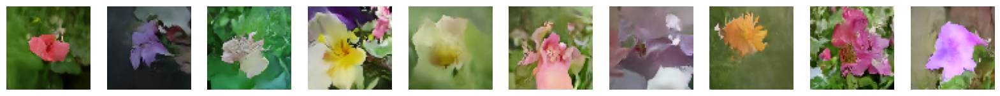

639/639 [==============================] - 134s 206ms/step - n_loss: 0.1737
Epoch 25/25
639/639 [==============================] - ETA: 0s - n_loss: 0.1736
Saved to ./output/generated_img_024.png


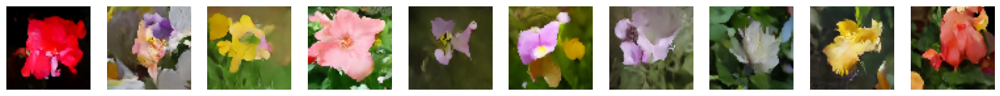

639/639 [==============================] - 135s 209ms/step - n_loss: 0.1736


In [31]:
ddm.fit(
    train,
    epochs=25,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
    ],
)

## Generation

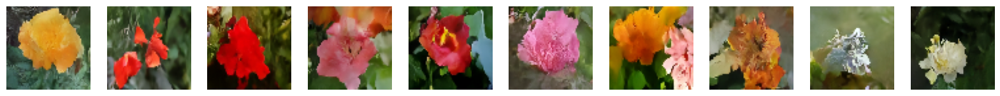

In [32]:
generated_images = ddm.generate(num_images=10, diffusion_steps=20).numpy()
display(generated_images)

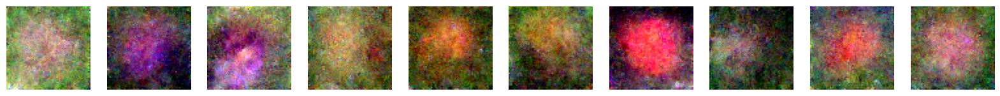

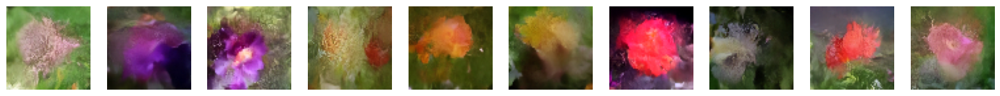

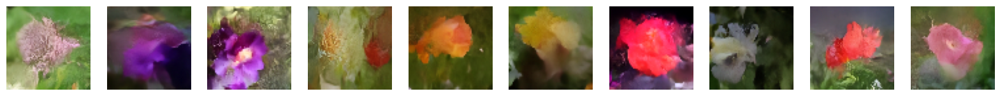

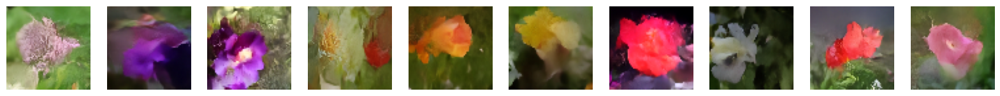

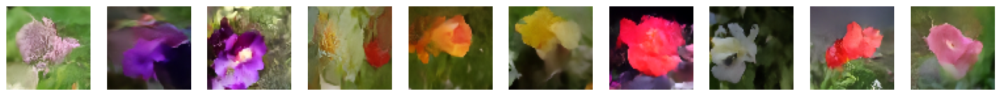

...

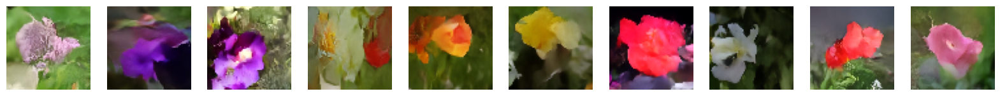

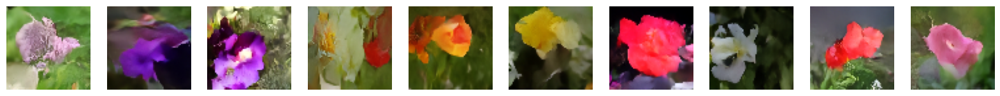

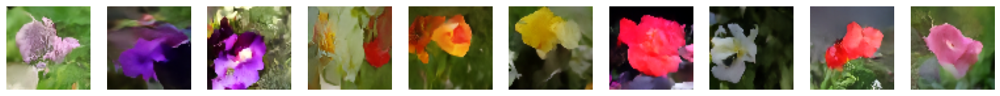

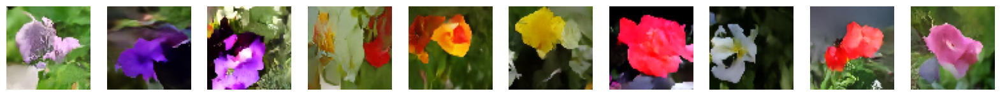

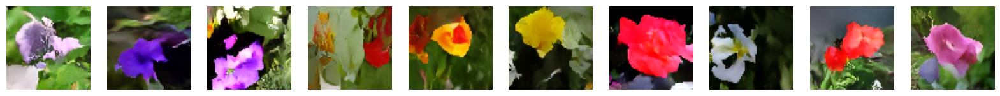

In [36]:
for diffusion_steps in list(np.arange(1, 10, 1)) + [20] + [100]:
    tf.random.set_seed(42)
    generated_images = ddm.generate(
        num_images=10,
        diffusion_steps=diffusion_steps,
    ).numpy()
    display(generated_images)

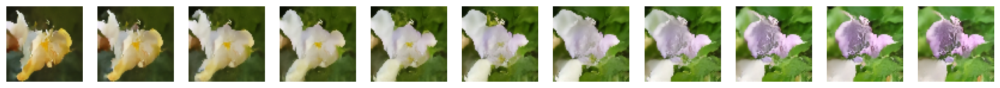

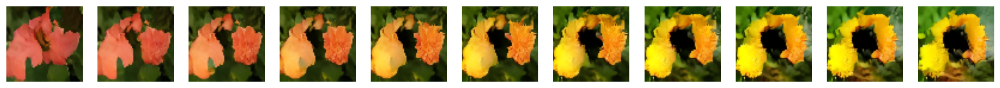

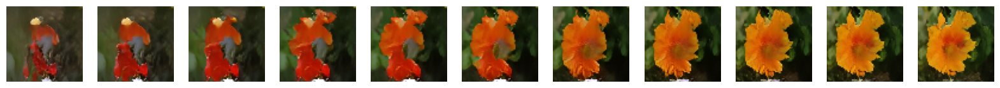

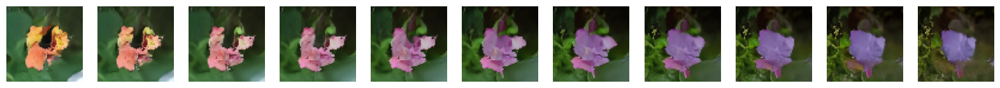

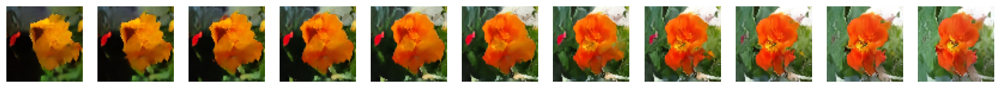

In [45]:
tf.random.set_seed(42)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(5):
    a = tf.random.normal(shape=(64, 64, 3))
    b = tf.random.normal(shape=(64, 64, 3))
    initial_noise = np.array(
        [spherical_interpolation(a, b, t) for t in np.arange(0, 1.1, 0.1)]
    )
    generated_images = ddm.generate(
        num_images=2, diffusion_steps=20, initial_noise=initial_noise
    ).numpy()
    display(generated_images, n=11)

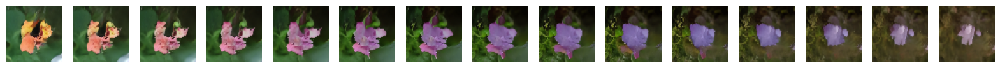

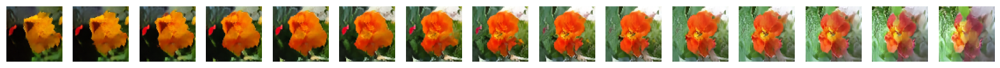

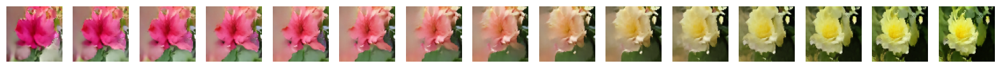

In [44]:
# tf.random.set_seed(42)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(3):
    a = tf.random.normal(shape=(64, 64, 3))
    b = tf.random.normal(shape=(64, 64, 3))
    initial_noise = np.array(
        [spherical_interpolation(a, b, t) for t in np.arange(0, 1.5, 0.1)]
    )
    generated_images = ddm.generate(
        num_images=2, diffusion_steps=20, initial_noise=initial_noise
    ).numpy()
    display(generated_images, n=15)